# Olist - Brazilian E-Commerce
## About Dataset
### Brazilian E-Commerce Public Dataset by Olist
Welcome! This is a Brazilian ecommerce public dataset of orders made at [Olist Store](https://www.olist.com/). The dataset has information of 100k orders from 2016 to 2018 made at multiple marketplaces in Brazil. Its features allows viewing an order from multiple dimensions: from order status, price, payment and freight performance to customer location, product attributes and finally reviews written by customers. We also released a geolocation dataset that relates Brazilian zip codes to lat/lng coordinates.

This is real commercial data, it has been anonymised, and references to the companies and partners in the review text have been replaced with the names of Game of Thrones great houses.

### Context
This dataset was generously provided by Olist, the largest department store in Brazilian marketplaces. Olist connects small businesses from all over Brazil to channels without hassle and with a single contract. Those merchants are able to sell their products through the Olist Store and ship them directly to the customers using Olist logistics partners. See more on our website: [Olist Store](https://www.olist.com/)

After a customer purchases the product from Olist Store a seller gets notified to fulfill that order. Once the customer receives the product, or the estimated delivery date is due, the customer gets a satisfaction survey by email where he can give a note for the purchase experience and write down some comments.

### Data Schema
![Brazilian E-Commerce Public Dataset by Olist](https://i.imgur.com/HRhd2Y0.png "Brazilian E-Commerce Public Dataset by Olist")

### Classified Dataset
We had previously released a classified dataset, but we removed it at Version 6. We intend to release it again as a new dataset with a new data schema. While we don't finish it, you may use the classified dataset available at the Version 5 or previous.


### Inspiration:
* Feature Engineering: Create features from this rich dataset or attach some external public information to it.
* Delivery Performance: Work through delivery performance and find ways to optimize delivery times.
* Clustering: Some customers didn't write a review. But why are they happy or mad?
* Sales Prediction: With purchase date information you'll be able to predict future sales.

In [1]:
import numpy as np
import pandas as pd
import missingno as msno
pd.options.display.float_format = '{:.2f}'.format
import seaborn as sns
from scipy.sparse import hstack, csr_matrix
import matplotlib.pyplot as plt
import plotly.express as px


from sklearn.impute import KNNImputer
from sklearn.impute import SimpleImputer
from datasist.structdata import detect_outliers
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV


from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


from sklearn.cluster import KMeans
from statsmodels.tsa.arima.model import ARIMA
import pmdarima as pm


import joblib 


import warnings
warnings.filterwarnings('ignore')

In [2]:
customers = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_customers_dataset.csv")
customers

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP
...,...,...,...,...,...
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS


In [3]:
orders =  pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_orders_dataset.csv")
orders

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00
...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28 00:00:00
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02 00:00:00
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27 00:00:00
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15 00:00:00


In [4]:
order_items = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_order_items_dataset.csv")
order_items

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14
...,...,...,...,...,...,...,...
112645,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41
112646,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53
112647,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95
112648,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72


In [5]:
order_payments = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_order_payments_dataset.csv")
order_payments

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45
...,...,...,...,...,...
103881,0406037ad97740d563a178ecc7a2075c,1,boleto,1,363.31
103882,7b905861d7c825891d6347454ea7863f,1,credit_card,2,96.80
103883,32609bbb3dd69b3c066a6860554a77bf,1,credit_card,1,47.77
103884,b8b61059626efa996a60be9bb9320e10,1,credit_card,5,369.54


In [6]:
order_reviews = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_order_reviews_dataset.csv")
order_reviews

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53
...,...,...,...,...,...,...,...
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,NaN,2018-07-07 00:00:00,2018-07-14 17:18:30
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,NaN,2017-12-09 00:00:00,2017-12-11 20:06:42
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,NaN,"Excelente mochila, entrega super rápida. Super...",2018-03-22 00:00:00,2018-03-23 09:10:43
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4,NaN,NaN,2018-07-01 00:00:00,2018-07-02 12:59:13


In [7]:
products = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_products_dataset.csv")
products

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.00,287.00,1.00,225.00,16.00,10.00,14.00
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.00,276.00,1.00,1000.00,30.00,18.00,20.00
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.00,250.00,1.00,154.00,18.00,9.00,15.00
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.00,261.00,1.00,371.00,26.00,4.00,26.00
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.00,402.00,4.00,625.00,20.00,17.00,13.00
...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.00,67.00,2.00,12300.00,40.00,40.00,40.00
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.00,971.00,1.00,1700.00,16.00,19.00,16.00
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.00,799.00,1.00,1400.00,27.00,7.00,27.00
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.00,156.00,2.00,700.00,31.00,13.00,20.00


In [8]:
sellers = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_sellers_dataset.csv")
sellers

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP
...,...,...,...,...
3090,98dddbc4601dd4443ca174359b237166,87111,sarandi,PR
3091,f8201cab383e484733266d1906e2fdfa,88137,palhoca,SC
3092,74871d19219c7d518d0090283e03c137,4650,sao paulo,SP
3093,e603cf3fec55f8697c9059638d6c8eb5,96080,pelotas,RS


In [9]:
category_translation = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\product_category_name_translation.csv")
category_translation

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor
...,...,...
66,flores,flowers
67,artes_e_artesanato,arts_and_craftmanship
68,fraldas_higiene,diapers_and_hygiene
69,fashion_roupa_infanto_juvenil,fashion_childrens_clothes


In [10]:
geolocation = pd.read_csv("D:\Courses\Datasets\Brazilian E-Commerce Public Dataset by Olist\olist_geolocation_dataset.csv")
geolocation

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.55,-46.64,sao paulo,SP
1,1046,-23.55,-46.64,sao paulo,SP
2,1046,-23.55,-46.64,sao paulo,SP
3,1041,-23.54,-46.64,sao paulo,SP
4,1035,-23.54,-46.64,sao paulo,SP
...,...,...,...,...,...
1000158,99950,-28.07,-52.01,tapejara,RS
1000159,99900,-27.88,-52.22,getulio vargas,RS
1000160,99950,-28.07,-52.01,tapejara,RS
1000161,99980,-28.39,-51.85,david canabarro,RS


In [11]:
file_paths = {
    "customers": "D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_customers_dataset.csv",
    "orders": "D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_orders_dataset.csv",
    "order_items": "D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_order_items_dataset.csv",
    "order_payments": "D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_order_payments_dataset.csv",
    "order_reviews": "D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_order_reviews_dataset.csv",
    "products": "D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_products_dataset.csv",
    "sellers": "D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_sellers_dataset.csv",
    "category_translation": "D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\product_category_name_translation.csv"
}

datasets = {name: pd.read_csv(path) for name, path in file_paths.items()}
summary_df = pd.DataFrame({
    "Dataset": list(datasets.keys()),
    "Rows": [df.shape[0] for df in datasets.values()],
    "Columns": [df.shape[1] for df in datasets.values()]})
summary_df

,Dataset,Rows,Columns
0,customers,99441,5
1,orders,99441,8
2,order_items,112650,7
3,order_payments,103886,5
4,order_reviews,99224,7
5,products,32951,9
6,sellers,3095,4
7,category_translation,71,2


# Order Status Distribution

In [12]:
var = orders['order_status'].value_counts().reset_index()
var

,order_status,count
0,delivered,96478
1,shipped,1107
2,canceled,625
3,unavailable,609
4,invoiced,314
5,processing,301
6,created,5
7,approved,2


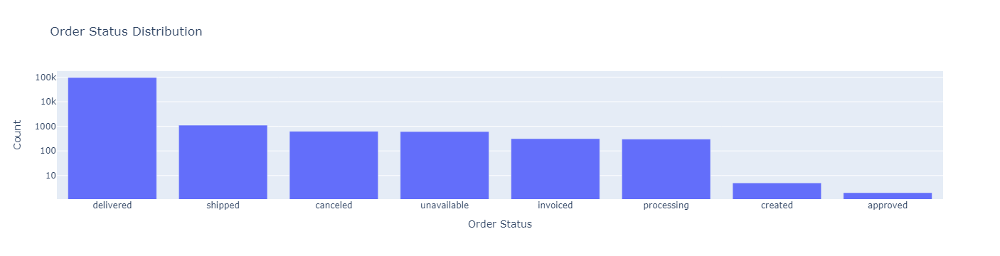

In [13]:
fig = px.bar(data_frame = orders['order_status'].value_counts().reset_index(), 
             x = var['order_status'], y = var['count'],
             title='Order Status Distribution',
             labels={'x':'Order Status', 'y':'Count'},
             log_y=True)
fig.show()

#  Orders Over Time

In [14]:
orders['order_purchase_timestamp'] = pd.to_datetime(orders['order_purchase_timestamp'], format='%Y-%m-%d %H:%M:%S')
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       99441 non-null  object        
 1   customer_id                    99441 non-null  object        
 2   order_status                   99441 non-null  object        
 3   order_purchase_timestamp       99441 non-null  datetime64[ns]
 4   order_approved_at              99281 non-null  object        
 5   order_delivered_carrier_date   97658 non-null  object        
 6   order_delivered_customer_date  96476 non-null  object        
 7   order_estimated_delivery_date  99441 non-null  object        
dtypes: datetime64[ns](1), object(7)
memory usage: 6.1+ MB


In [15]:
orders_per_month = orders.groupby(orders['order_purchase_timestamp'].dt.to_period('M')).size().reset_index(name='count')
orders_per_month

,order_purchase_timestamp,count
0,2016-09,4
1,2016-10,324
2,2016-12,1
3,2017-01,800
4,2017-02,1780
5,2017-03,2682
6,2017-04,2404
7,2017-05,3700
8,2017-06,3245
9,2017-07,4026


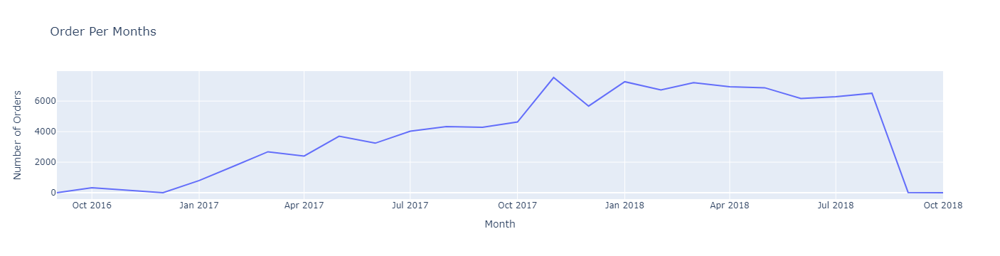

In [16]:
fig = px.line(data_frame=orders_per_month,
              x=orders_per_month['order_purchase_timestamp'].astype(str), y=orders_per_month['count'],
              title = 'Order Per Months',
              labels = {'x':'Month', 'count':'Number of Orders'})
fig.show()

# Top Selling Product Categories

In [17]:
products = products.merge(category_translation, on='product_category_name', how='left')
products

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.00,287.00,1.00,225.00,16.00,10.00,14.00,perfumery
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.00,276.00,1.00,1000.00,30.00,18.00,20.00,art
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.00,250.00,1.00,154.00,18.00,9.00,15.00,sports_leisure
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.00,261.00,1.00,371.00,26.00,4.00,26.00,baby
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.00,402.00,4.00,625.00,20.00,17.00,13.00,housewares
...,...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.00,67.00,2.00,12300.00,40.00,40.00,40.00,furniture_decor
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.00,971.00,1.00,1700.00,16.00,19.00,16.00,construction_tools_lights
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.00,799.00,1.00,1400.00,27.00,7.00,27.00,bed_bath_table
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.00,156.00,2.00,700.00,31.00,13.00,20.00,computers_accessories


In [18]:
top_category = products['product_category_name_english'].value_counts().nlargest(10).reset_index()
top_category

,product_category_name_english,count
0,bed_bath_table,3029
1,sports_leisure,2867
2,furniture_decor,2657
3,health_beauty,2444
4,housewares,2335
5,auto,1900
6,computers_accessories,1639
7,toys,1411
8,watches_gifts,1329
9,telephony,1134


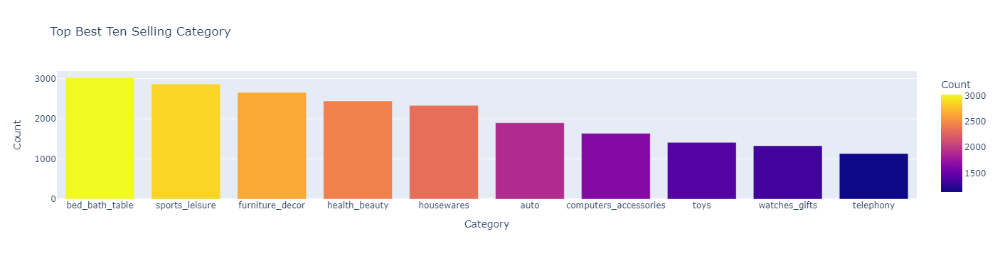

In [19]:
fig = px.bar(data_frame=top_category,
             x=top_category['product_category_name_english'], y='count',
             title='Top Best Ten Selling Category',
             labels={'product_category_name_english':'Category', 'count':'Count'}, color='count')
fig.show()

# Total Revenue Over Time

In [20]:
df = orders.merge(order_payments, on='order_id', how='left')
df = df.merge(order_items, on='order_id', how='left')
df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1.00,credit_card,1.00,18.12,1.00,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,3.00,voucher,1.00,2.00,1.00,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,2.00,voucher,1.00,18.59,1.00,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,1.00,boleto,1.00,141.46,1.00,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,1.00,credit_card,3.00,179.12,1.00,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22


In [21]:
df['order_revenue'] = df['price'] + df['freight_value']
df.columns

Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'payment_sequential', 'payment_type', 'payment_installments',
       'payment_value', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value', 'order_revenue'],
      dtype='object')

In [22]:
revenue_per_month = df.groupby(df['order_purchase_timestamp'].dt.to_period('M')).size().reset_index()
revenue_per_month

,order_purchase_timestamp,0
0,2016-09,7
1,2016-10,397
2,2016-12,1
3,2017-01,1017
4,2017-02,2112
5,2017-03,3223
6,2017-04,2869
7,2017-05,4436
8,2017-06,3812
9,2017-07,4902


In [23]:
revenue_per_month.columns = ['order_purchase_timestamp', 'count']
revenue_per_month.columns

Index(['order_purchase_timestamp', 'count'], dtype='object')

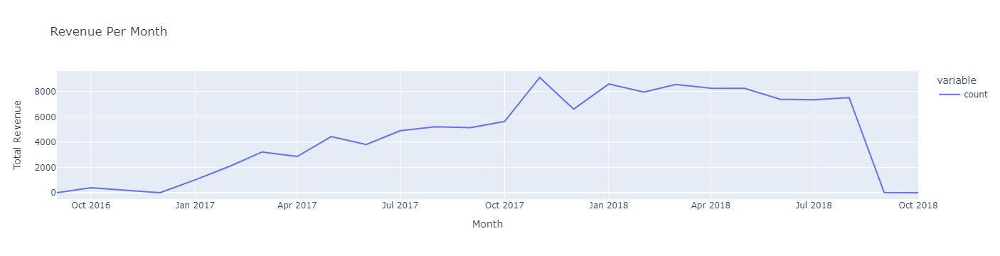

In [24]:
fig = px.line(data_frame=revenue_per_month, 
              x=revenue_per_month['order_purchase_timestamp'].astype(str), y=['count'],
              title = 'Revenue Per Month',
              labels ={'x': 'Month', 'value':'Total Revenue'})
fig.show()

# Top Selling Products by Revenue

In [25]:
top_product = df.groupby('product_id')['order_revenue'].sum().nlargest(10).reset_index()
top_product

,product_id,order_revenue
0,bb50f2e236e5eea0100680137654686c,72470.19
1,d1c427060a0f73f6b889a5c7c61f2ac4,63846.01
2,6cdd53843498f92890544667809f1595,60229.82
3,d6160fb7873f184099d9bc95e30376af,58608.48
4,99a4788cb24856965c36a24e339b6058,54936.19
5,3dd2a17168ec895c781a9191c1e95ad7,48913.68
6,25c38557cf793876c5abdd5931f922db,46466.21
7,aca2eb7d00ea1a7b8ebd4e68314663af,45522.32
8,5f504b3a1c75b73d6151be81eb05bdc9,41725.81
9,53b36df67ebb7c41585e8d54d6772e08,40467.30


In [26]:
top_product = top_product.merge(products, on='product_id', how='left')
top_product

,product_id,order_revenue,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,bb50f2e236e5eea0100680137654686c,72470.19,beleza_saude,60.00,2644.00,6.00,400.00,34.00,4.00,22.00,health_beauty
1,d1c427060a0f73f6b889a5c7c61f2ac4,63846.01,informatica_acessorios,59.00,1893.00,1.00,6550.00,20.00,20.00,20.00,computers_accessories
2,6cdd53843498f92890544667809f1595,60229.82,beleza_saude,51.00,625.00,1.00,900.00,25.00,12.00,38.00,health_beauty
3,d6160fb7873f184099d9bc95e30376af,58608.48,pcs,55.00,3632.00,4.00,2600.00,16.00,31.00,39.00,computers
4,99a4788cb24856965c36a24e339b6058,54936.19,cama_mesa_banho,54.00,245.00,1.00,1383.00,50.00,10.00,40.00,bed_bath_table
5,3dd2a17168ec895c781a9191c1e95ad7,48913.68,informatica_acessorios,48.00,894.00,1.00,533.00,22.00,11.00,20.00,computers_accessories
6,25c38557cf793876c5abdd5931f922db,46466.21,bebes,58.00,1447.00,5.00,15800.00,38.00,62.00,57.00,baby
7,aca2eb7d00ea1a7b8ebd4e68314663af,45522.32,moveis_decoracao,44.00,903.00,6.00,2600.00,50.00,10.00,30.00,furniture_decor
8,5f504b3a1c75b73d6151be81eb05bdc9,41725.81,cool_stuff,38.00,1176.00,3.00,15350.00,47.00,40.00,47.00,cool_stuff
9,53b36df67ebb7c41585e8d54d6772e08,40467.30,relogios_presentes,33.00,523.00,3.00,584.00,16.00,11.00,13.00,watches_gifts


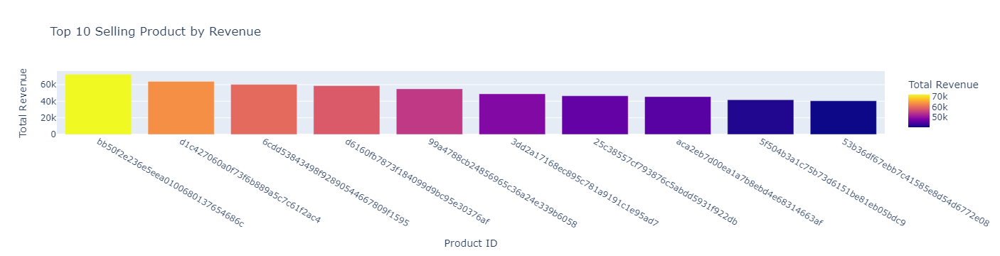

In [27]:
fig = px.bar(data_frame=top_product, x='product_id', y='order_revenue',
              title='Top 10 Selling Product by Revenue',
              labels={'product_id':'Product ID', 'order_revenue':'Total Revenue'},
              color='order_revenue')
fig.show()

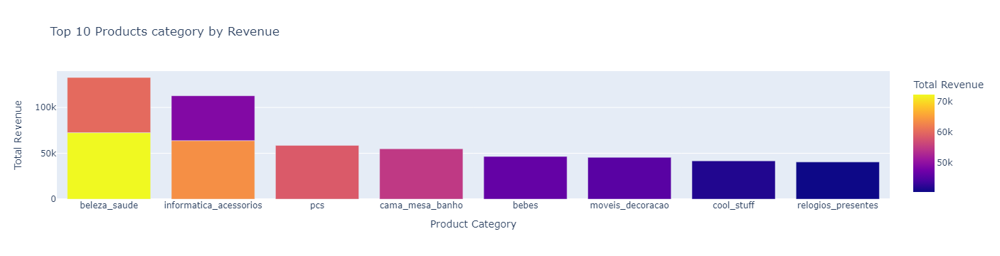

In [28]:
fig = px.bar(top_product, x='product_category_name', y='order_revenue',
              title='Top 10 Products category by Revenue',
              labels={'product_category_name': 'Product Category', 'order_revenue': 'Total Revenue'},
              color='order_revenue')
fig.show()

# Average Order Value

In [29]:
order_values = df.groupby("order_id")["order_revenue"].sum().reset_index()
order_values.value_counts().reset_index()

,order_id,order_revenue,count
0,00010242fe8c5a6d1ba2dd792cb16214,72.19,1
1,ab291c01a71273689c1e6ea624b083dc,71.82,1
2,ab344aaf7040ad7bcee8c7ae7db9e87e,63.93,1
3,ab30f8d4ebb7d33d1dcf54d420ea42cd,66.52,1
4,ab30f399d360ddf62897051d813f887d,136.24,1
...,...,...,...
99436,55539e6edbbf2276dc9e2eab8af0fa8d,68.51,1
99437,55538582ef35a95e5ed4047c6bf04695,147.15,1
99438,5553543e89ef381e4ff08f6b91b94690,378.93,1
99439,55534471fcbe2dd1436234e7cfa4de5a,452.00,1


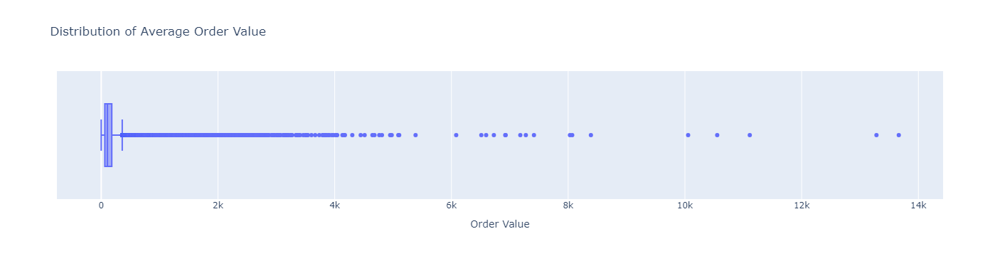

In [30]:
fig = px.box(order_values, x="order_revenue",
               title="Distribution of Average Order Value",
               labels={"order_revenue": "Order Value"})
fig.show()

# Customer Purchase Frequency

In [31]:
customer_orders = orders["customer_id"].value_counts().reset_index()
customer_orders

,customer_id,count
0,9ef432eb6251297304e76186b10a928d,1
1,413f7e58270a32396af030a075b924be,1
2,eb4350b67a0264c67e5e06a038e4afbb,1
3,622b07d262d545d16efbd4363a89cb91,1
4,c701fbfa77791abd05eef9eacf7ea7a8,1
...,...,...
99436,39585f08d13377e50fde35467984e6eb,1
99437,eb3d995301c320683de629f5b4dd0c78,1
99438,f2507ea56d748a23037bb1214964e87d,1
99439,ae8269d850cd3a3d06a56877c450b3f8,1


In [32]:
customer_orders.columns = ["customer_id", "order_count"]
customer_orders.columns

Index(['customer_id', 'order_count'], dtype='object')

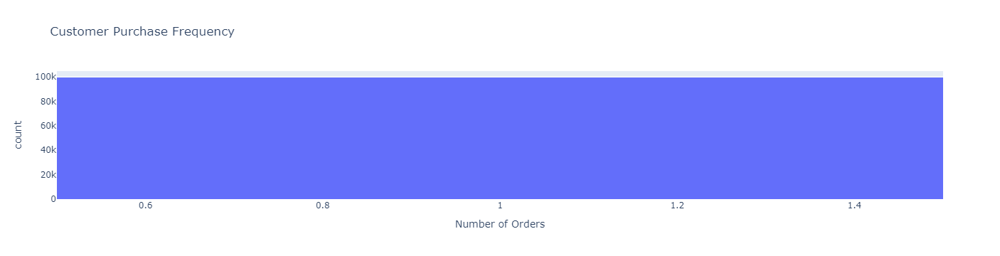

In [33]:
fig = px.histogram(data_frame=customer_orders, x="order_count",
                    title="Customer Purchase Frequency",
                    labels={"order_count": "Number of Orders", "count": "Number of Customers"},
                    nbins=20)
fig.show()

# Top Sellers by Revenue

In [35]:
saller_orders = order_items.merge(sellers, on='seller_id', how='left')
saller_orders = saller_orders.merge(order_payments, on='order_id', how='left')
saller_orders

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,seller_zip_code_prefix,seller_city,seller_state,payment_sequential,payment_type,payment_installments,payment_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,27277,volta redonda,SP,1.00,credit_card,2.00,72.19
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,3471,sao paulo,SP,1.00,credit_card,3.00,259.83
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,37564,borda da mata,MG,1.00,credit_card,5.00,216.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,14403,franca,SP,1.00,credit_card,2.00,25.78
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,87900,loanda,PR,1.00,credit_card,3.00,218.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117599,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41,88303,itajai,SC,1.00,boleto,1.00,343.40
117600,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53,1206,sao paulo,SP,1.00,boleto,1.00,386.53
117601,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,80610,curitiba,PR,1.00,credit_card,3.00,116.85
117602,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72,4733,sao paulo,SP,1.00,credit_card,3.00,64.71


In [36]:
saller_revenue = saller_orders.groupby('seller_id')['price'].sum().reset_index()
saller_revenue

,seller_id,price
0,0015a82c2db000af6aaaf3ae2ecb0532,2685.00
1,001cca7ae9ae17fb1caed9dfb1094831,25248.93
2,001e6ad469a905060d959994f1b41e4f,250.00
3,002100f778ceb8431b7a1020ff7ab48f,1283.20
4,003554e2dce176b5555353e4f3555ac8,120.00
...,...,...
3090,ffcfefa19b08742c5d315f2791395ee5,69.90
3091,ffdd9f82b9a447f6f8d4b91554cc7dd3,2140.80
3092,ffeee66ac5d5a62fe688b9d26f83f534,1839.86
3093,fffd5413c0700ac820c7069d66d98c89,9360.90


In [37]:
top_sallers = saller_revenue.nlargest(10, "price")
top_sallers

,seller_id,price
1013,53243585a1d6dc2643021fd1853d8905,244627.55
857,4869f7a5dfa277a7dca6462dcf3b52b2,237867.23
881,4a3ca9315b744ce9f8e9374361493884,213299.57
3024,fa1c13f2614d7b5c4749cbc52fecda94,203984.22
1535,7c67e1448b00f6e969d365cea6b010ab,198194.33
1560,7e93a43ef30c4f03f38b393420bc753a,182878.17
2643,da8622b14eb17ae2831f4ac5b9dab84a,169297.77
1505,7a67c85e85bb2ce8582c35f2203ad736,149939.84
192,1025f0e2d44d7041d6cf58b6550e0bfa,142130.94
1824,955fee9216a65b617aa5c0531780ce60,137335.00


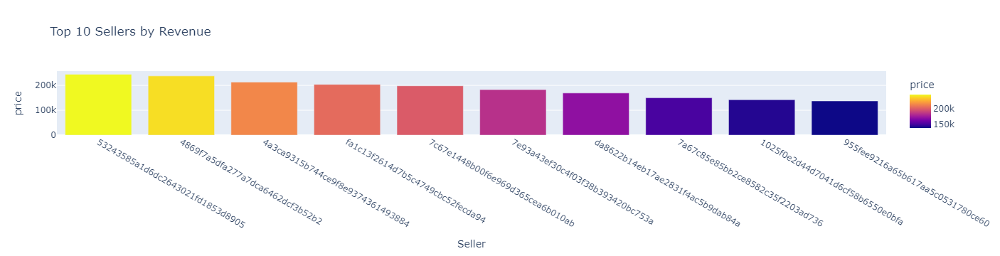

In [38]:
fig = px.bar( data_frame=top_sallers, x='seller_id', y='price',
               title='Top 10 Sellers by Revenue',
               labels = {'seller_id':'Seller', 'Pricr':'Total Revenue'},
               color='price')
fig.show()

# Sallers per State

In [39]:
saller_per_state = sellers['seller_state'].value_counts().reset_index()
saller_per_state.head()

,seller_state,count
0,SP,1849
1,PR,349
2,MG,244
3,SC,190
4,RJ,171


In [41]:
saller_per_state.columns = ["state", "num_sellers"]
saller_per_state.head()

,state,num_sellers
0,SP,1849
1,PR,349
2,MG,244
3,SC,190
4,RJ,171


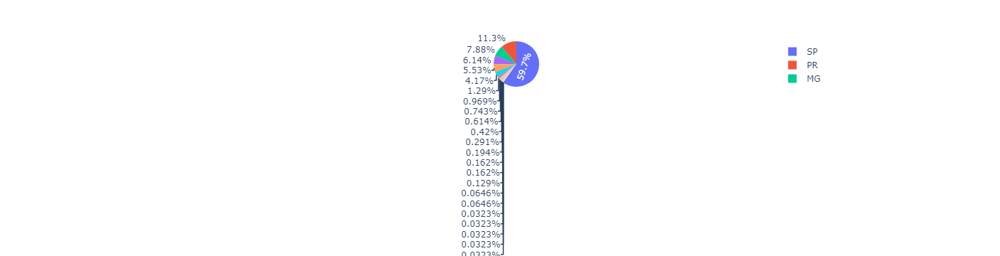

In [42]:
fig = px.pie(data_frame=saller_per_state, names='state', values='num_sellers',
    labels={'state':'State', 'num_sellers':'Total Revenue'})
fig.show()

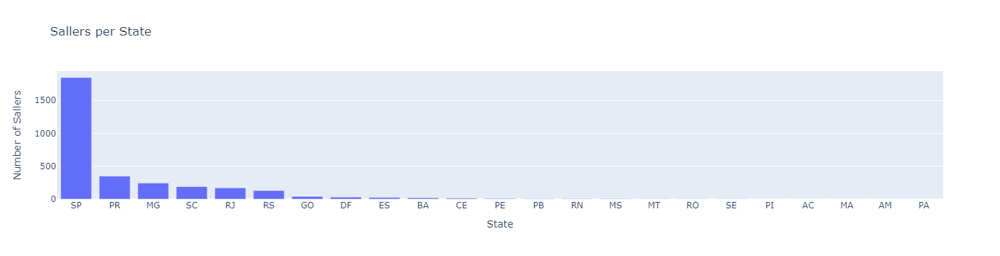

In [47]:
fig = px.bar(data_frame=saller_per_state,
             x='state', y='num_sellers',
             title='Sallers per State', 
             labels={'state':'State', 'num_sellers':'Number of Sallers'})
fig.show()

# Top Cities with the Most Customers

In [44]:
customers_per_city = customers["customer_city"].value_counts().reset_index()
customers_per_city

,customer_city,count
0,sao paulo,15540
1,rio de janeiro,6882
2,belo horizonte,2773
3,brasilia,2131
4,curitiba,1521
...,...,...
4114,bequimao,1
4115,andarai,1
4116,vargem grande,1
4117,curvelandia,1


In [45]:
customers_per_city.columns = ['city', "num_customers"]
customers_per_city.columns

Index(['city', 'num_customers'], dtype='object')

In [46]:
top_cities = customers_per_city.head(10)
top_cities

,city,num_customers
0,sao paulo,15540
1,rio de janeiro,6882
2,belo horizonte,2773
3,brasilia,2131
4,curitiba,1521
5,campinas,1444
6,porto alegre,1379
7,salvador,1245
8,guarulhos,1189
9,sao bernardo do campo,938


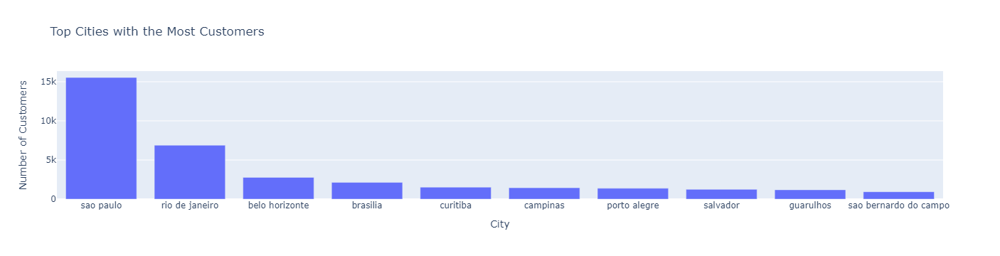

In [48]:
fig = px.bar(data_frame=top_cities,
             x='city', y='num_customers',
             title='Top Cities with the Most Customers', 
             labels={'city':'City', 'num_customers':'Number of Customers'})
fig.show()

# Customer Distribution Across States

In [49]:
customers_per_state = customers['customer_state'].value_counts().reset_index()
customers_per_state

,customer_state,count
0,SP,41746
1,RJ,12852
2,MG,11635
3,RS,5466
4,PR,5045
5,SC,3637
6,BA,3380
7,DF,2140
8,ES,2033
9,GO,2020


In [50]:
customers_per_state.columns = ['customer_state', 'num_customers']
customers_per_state.columns

Index(['customer_state', 'num_customers'], dtype='object')

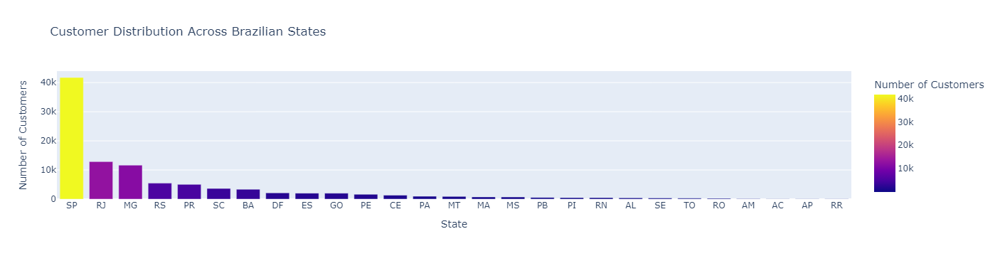

In [51]:
fig = px.bar(customers_per_state, x='customer_state', y='num_customers',
               title='Customer Distribution Across Brazilian States',
               labels={'customer_state': 'State', 'num_customers': 'Number of Customers'},
               color='num_customers')
fig.show()

# Price Distribution of Products

In [52]:
products

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.00,287.00,1.00,225.00,16.00,10.00,14.00,perfumery
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.00,276.00,1.00,1000.00,30.00,18.00,20.00,art
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.00,250.00,1.00,154.00,18.00,9.00,15.00,sports_leisure
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.00,261.00,1.00,371.00,26.00,4.00,26.00,baby
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.00,402.00,4.00,625.00,20.00,17.00,13.00,housewares
...,...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.00,67.00,2.00,12300.00,40.00,40.00,40.00,furniture_decor
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.00,971.00,1.00,1700.00,16.00,19.00,16.00,construction_tools_lights
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.00,799.00,1.00,1400.00,27.00,7.00,27.00,bed_bath_table
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.00,156.00,2.00,700.00,31.00,13.00,20.00,computers_accessories


In [53]:
print("Product Price Statistics:\n", order_items["price"].describe())

Product Price Statistics:
 count   112650.00
mean       120.65
std        183.63
min          0.85
25%         39.90
50%         74.99
75%        134.90
max       6735.00
Name: price, dtype: float64


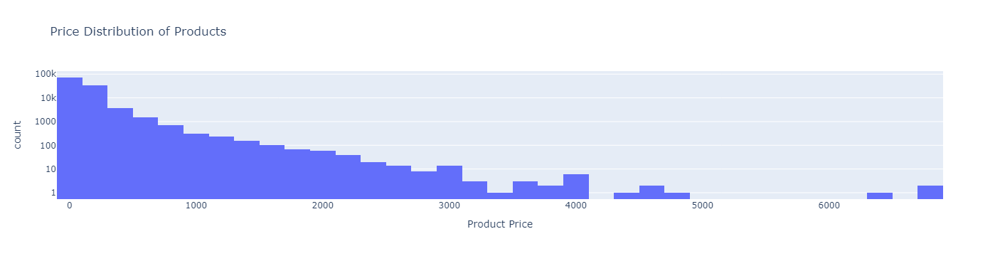

In [54]:
fig = px.histogram(order_items['price'], x='price', nbins=50,
                    title='Price Distribution of Products', 
                    labels={'price':'Product Price', 'count':'Number of Products'},
                    log_y=True)
fig.show()

# Products vs Revenue Correlation

In [55]:
product_per_saller = saller_orders.groupby('seller_id')['product_id'].count().reset_index()
product_per_saller

,seller_id,product_id
0,0015a82c2db000af6aaaf3ae2ecb0532,3
1,001cca7ae9ae17fb1caed9dfb1094831,241
2,001e6ad469a905060d959994f1b41e4f,1
3,002100f778ceb8431b7a1020ff7ab48f,58
4,003554e2dce176b5555353e4f3555ac8,1
...,...,...
3090,ffcfefa19b08742c5d315f2791395ee5,1
3091,ffdd9f82b9a447f6f8d4b91554cc7dd3,21
3092,ffeee66ac5d5a62fe688b9d26f83f534,14
3093,fffd5413c0700ac820c7069d66d98c89,62


In [56]:
product_per_saller.columns = ['seller_id', 'num_of_products']
product_per_saller.columns

Index(['seller_id', 'num_of_products'], dtype='object')

In [57]:
saller_performance = product_per_saller.merge(saller_revenue, on='seller_id')
saller_performance

,seller_id,num_of_products,price
0,0015a82c2db000af6aaaf3ae2ecb0532,3,2685.00
1,001cca7ae9ae17fb1caed9dfb1094831,241,25248.93
2,001e6ad469a905060d959994f1b41e4f,1,250.00
3,002100f778ceb8431b7a1020ff7ab48f,58,1283.20
4,003554e2dce176b5555353e4f3555ac8,1,120.00
...,...,...,...
3090,ffcfefa19b08742c5d315f2791395ee5,1,69.90
3091,ffdd9f82b9a447f6f8d4b91554cc7dd3,21,2140.80
3092,ffeee66ac5d5a62fe688b9d26f83f534,14,1839.86
3093,fffd5413c0700ac820c7069d66d98c89,62,9360.90


In [58]:
correlation = saller_performance['num_of_products'].corr(saller_performance['price'])
print(f'Correlation between Number of Products & Revenue:{correlation:.2f}')

Correlation between Number of Products & Revenue:0.79


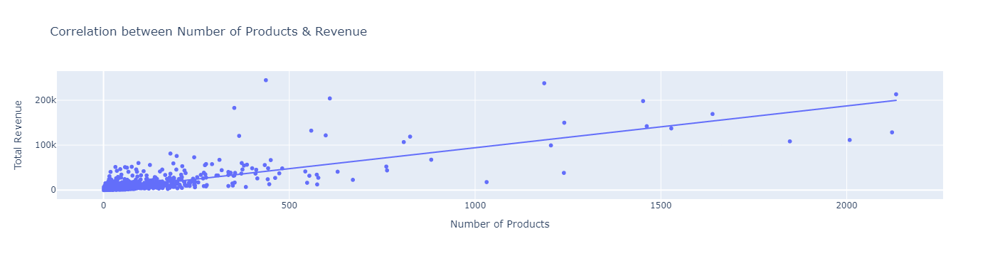

In [59]:
fig = px.scatter(saller_performance, x='num_of_products', y='price',
                   title='Correlation between Number of Products & Revenue',
                   labels={'num_of_products': 'Number of Products', 'price': 'Total Revenue'},
                   trendline='ols')
fig.show()

# Correlation Between Price & Quantity Sold

In [60]:
product_sales = order_items.merge(products, on='product_id', how='left')
product_sales

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,cool_stuff,58.00,598.00,4.00,650.00,28.00,9.00,14.00,cool_stuff
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,pet_shop,56.00,239.00,2.00,30000.00,50.00,30.00,40.00,pet_shop
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,moveis_decoracao,59.00,695.00,2.00,3050.00,33.00,13.00,33.00,furniture_decor
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,perfumaria,42.00,480.00,1.00,200.00,16.00,10.00,15.00,perfumery
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,ferramentas_jardim,59.00,409.00,1.00,3750.00,35.00,40.00,30.00,garden_tools
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112645,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41,utilidades_domesticas,43.00,1002.00,3.00,10150.00,89.00,15.00,40.00,housewares
112646,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53,informatica_acessorios,31.00,232.00,1.00,8950.00,45.00,26.00,38.00,computers_accessories
112647,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,esporte_lazer,43.00,869.00,1.00,967.00,21.00,24.00,19.00,sports_leisure
112648,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72,informatica_acessorios,56.00,1306.00,1.00,100.00,20.00,20.00,20.00,computers_accessories


In [61]:
product_quantity = product_sales.groupby('product_id')['order_item_id'].count().reset_index()
product_quantity

,product_id,order_item_id
0,00066f42aeeb9f3007548bb9d3f33c38,1
1,00088930e925c41fd95ebfe695fd2655,1
2,0009406fd7479715e4bef61dd91f2462,1
3,000b8f95fcb9e0096488278317764d19,2
4,000d9be29b5207b54e86aa1b1ac54872,1
...,...,...
32946,fff6177642830a9a94a0f2cba5e476d1,2
32947,fff81cc3158d2725c0655ab9ba0f712c,1
32948,fff9553ac224cec9d15d49f5a263411f,1
32949,fffdb2d0ec8d6a61f0a0a0db3f25b441,5


In [62]:
product_quantity.columns= ['product_id', 'quantity_sold']
product_quantity.columns

Index(['product_id', 'quantity_sold'], dtype='object')

In [63]:
product_revenue = product_sales.groupby("product_id")["price"].sum().reset_index()
product_revenue

,product_id,price
0,00066f42aeeb9f3007548bb9d3f33c38,101.65
1,00088930e925c41fd95ebfe695fd2655,129.90
2,0009406fd7479715e4bef61dd91f2462,229.00
3,000b8f95fcb9e0096488278317764d19,117.80
4,000d9be29b5207b54e86aa1b1ac54872,199.00
...,...,...
32946,fff6177642830a9a94a0f2cba5e476d1,229.98
32947,fff81cc3158d2725c0655ab9ba0f712c,90.00
32948,fff9553ac224cec9d15d49f5a263411f,32.00
32949,fffdb2d0ec8d6a61f0a0a0db3f25b441,169.95


In [64]:
product_revenue.columns = ['product_id', 'total_revenue']
product_revenue.columns

Index(['product_id', 'total_revenue'], dtype='object')

In [65]:
price_vs_sales = product_quantity.merge(product_revenue, on='product_id')
price_vs_sales

,product_id,quantity_sold,total_revenue
0,00066f42aeeb9f3007548bb9d3f33c38,1,101.65
1,00088930e925c41fd95ebfe695fd2655,1,129.90
2,0009406fd7479715e4bef61dd91f2462,1,229.00
3,000b8f95fcb9e0096488278317764d19,2,117.80
4,000d9be29b5207b54e86aa1b1ac54872,1,199.00
...,...,...,...
32946,fff6177642830a9a94a0f2cba5e476d1,2,229.98
32947,fff81cc3158d2725c0655ab9ba0f712c,1,90.00
32948,fff9553ac224cec9d15d49f5a263411f,1,32.00
32949,fffdb2d0ec8d6a61f0a0a0db3f25b441,5,169.95


In [66]:
correlation = price_vs_sales['quantity_sold'].corr(price_vs_sales['total_revenue'])
print(f"Correlation between Price & Quantity Sold: {correlation:.2f}")

Correlation between Price & Quantity Sold: 0.70


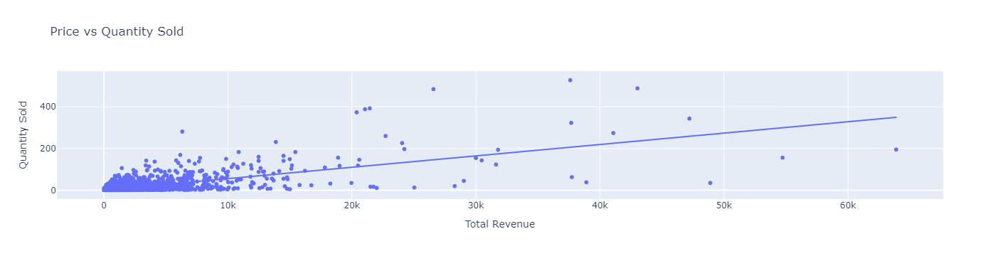

In [67]:
fig = px.scatter(price_vs_sales, x='total_revenue', y='quantity_sold',
                   title='Price vs Quantity Sold',
                   labels={'total_revenue': 'Total Revenue', 'quantity_sold': 'Quantity Sold'},
                   trendline='ols')
fig.show()

# Delivery Performance

In [68]:
customers = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_customers_dataset.csv")
orders =  pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_orders_dataset.csv")
order_items = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_order_items_dataset.csv")
order_payments = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_order_payments_dataset.csv")
sellers = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_sellers_dataset.csv")
products = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_products_dataset.csv")
geolocation = pd.read_csv("D:\Courses\Datasets\Brazilian E-Commerce Public Dataset by Olist\olist_geolocation_dataset.csv")

In [70]:
orders['order_delivered_customer_date'] = pd.to_datetime(orders['order_delivered_customer_date'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
orders['order_estimated_delivery_date'] = pd.to_datetime(orders['order_estimated_delivery_date'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
orders['order_purchase_timestamp'] = pd.to_datetime(orders['order_purchase_timestamp'], errors='coerce')
df = order_items.merge(orders, on='order_id', how='left')
df = df.merge(sellers, on="seller_id", how="left")
df = df.merge(products, on="product_id", how="left")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 25 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_id                       112650 non-null  object        
 1   order_item_id                  112650 non-null  int64         
 2   product_id                     112650 non-null  object        
 3   seller_id                      112650 non-null  object        
 4   shipping_limit_date            112650 non-null  object        
 5   price                          112650 non-null  float64       
 6   freight_value                  112650 non-null  float64       
 7   customer_id                    112650 non-null  object        
 8   order_status                   112650 non-null  object        
 9   order_purchase_timestamp       112650 non-null  datetime64[ns]
 10  order_approved_at              112635 non-null  object        
 11  

In [71]:
orders['delovery_days'] = orders['order_delivered_customer_date'].dt.day - orders['order_purchase_timestamp'].dt.day
orders['estimated_days'] = orders['order_estimated_delivery_date'].dt.day - orders['order_purchase_timestamp'].dt.day
orders

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delovery_days,estimated_days
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,8.00,16
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,-17.00,-11
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,9.00,-4
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,-16.00,-3
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,3.00,13
...,...,...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,8.00,19
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,22.00,-4
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,-6.00,0
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,17.00,7


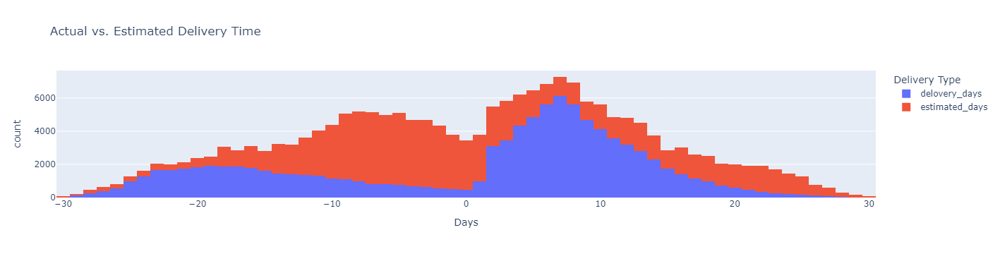

In [72]:
fig = px.histogram(data_frame=orders, x=['delovery_days', 'estimated_days'], 
                    title='Actual vs. Estimated Delivery Time',
                    labels={'value':'Days', 'variable':'Delivery Type'})
fig.show()

In [73]:
df["delivery_delay"] = (df["order_delivered_customer_date"] - df["order_estimated_delivery_date"]).dt.days
df["actual_delivery_time"] = (df["order_delivered_customer_date"] - df["order_purchase_timestamp"]).dt.days
df[["delivery_delay", "actual_delivery_time"]].describe()

,delivery_delay,actual_delivery_time
count,110196.00,110196.00
mean,-12.03,12.01
std,10.16,9.45
min,-147.00,0.00
25%,-17.00,6.00
50%,-13.00,10.00
75%,-7.00,15.00
max,188.00,209.00


In [74]:
df['delivery_status'] = df['delivery_delay'].apply(lambda x: 'Delayed' if x > 0 else 'On-Time')
delivery_counts = df['delivery_status'].value_counts(normalize=True) * 100
delivery_counts

delivery_status
On-Time   93.55
Delayed    6.45
Name: proportion, dtype: float64

In [75]:
delivery_counts_df = delivery_counts.reset_index()
delivery_counts_df.columns = ['delivery_status', 'Precentages (%)']
delivery_counts_df

,delivery_status,Precentages (%)
0,On-Time,93.55
1,Delayed,6.45


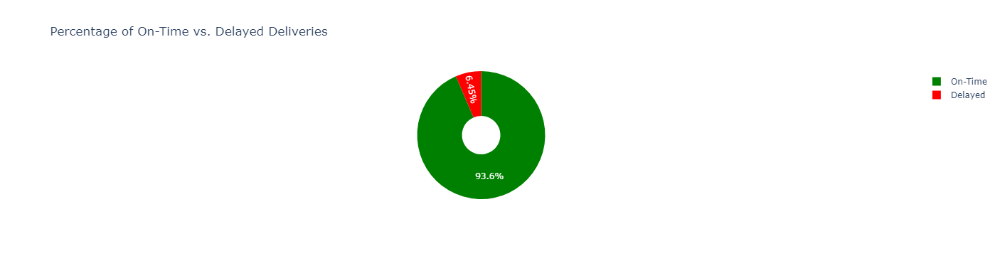

In [76]:
fig = px.pie(values=delivery_counts.values, 
             names=delivery_counts.index, 
             title="Percentage of On-Time vs. Delayed Deliveries",
             hole=0.3, 
             color=delivery_counts.index, 
             color_discrete_map={'On-Time': 'green', 'Delayed': 'red'})
fig.show()

If the delayed percentage is high, we need to analyze what causes these delays (e.g., product type, seller, region), but these Precentages is good

## Identifying Delays by Product Category

In [77]:
df.columns

Index(['order_id', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value', 'customer_id',
       'order_status', 'order_purchase_timestamp', 'order_approved_at',
       'order_delivered_carrier_date', 'order_delivered_customer_date',
       'order_estimated_delivery_date', 'seller_zip_code_prefix',
       'seller_city', 'seller_state', 'product_category_name',
       'product_name_lenght', 'product_description_lenght',
       'product_photos_qty', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm', 'delivery_delay',
       'actual_delivery_time', 'delivery_status'],
      dtype='object')

In [78]:
category_delays = df.groupby('product_category_name')['delivery_status'].value_counts(normalize=True).unstack() * 100
category_delays = category_delays.fillna(0)
category_delays = category_delays.sort_values(by='Delayed', ascending=False)
category_delays.head(10)

delivery_status,Delayed,On-Time
product_category_name,,
casa_conforto_2,13.33,86.67
moveis_colchao_e_estofado,13.16,86.84
audio,11.54,88.46
artigos_de_natal,9.80,90.20
casa_conforto,9.22,90.78
fashion_underwear_e_moda_praia,9.16,90.84
livros_tecnicos,7.87,92.13
moveis_escritorio,7.87,92.13
eletronicos,7.48,92.52


This table will rank the product categories with the highest delay percentage.

* The unstack() function transforms a multi-level index in a DataFrame or Series into columns. It's essentially a way to reshape or pivot your data.
* When applied to a DataFrame with a MultiIndex, unstack() moves the innermost level of the index to become columns.
* By default, it unstacks the last level, but you can specify which level to unstack by passing a level parameter.
* It's particularly useful for creating pivot tables or reshaping hierarchical data

In [79]:
top_delayed_categories = category_delays.reset_index().head(10)
top_delayed_categories

delivery_status,product_category_name,Delayed,On-Time
0,casa_conforto_2,13.33,86.67
1,moveis_colchao_e_estofado,13.16,86.84
2,audio,11.54,88.46
3,artigos_de_natal,9.80,90.20
4,casa_conforto,9.22,90.78
5,fashion_underwear_e_moda_praia,9.16,90.84
6,livros_tecnicos,7.87,92.13
7,moveis_escritorio,7.87,92.13
8,eletronicos,7.48,92.52
9,bebes,7.47,92.53


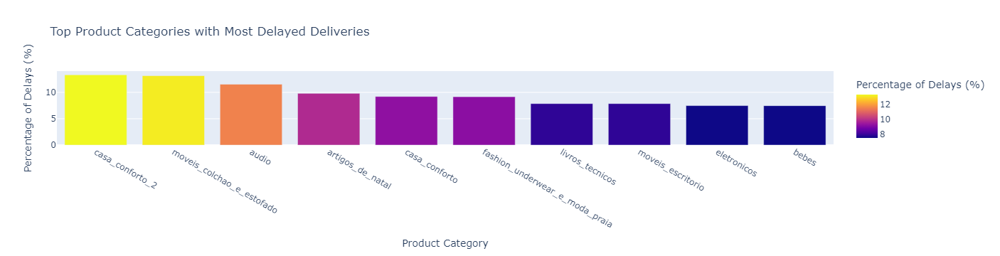

In [80]:
fig = px.bar(top_delayed_categories, 
             x='product_category_name', 
             y='Delayed', 
             title="Top Product Categories with Most Delayed Deliveries",
             labels={'product_category_name':'Product Category','Delayed': 'Percentage of Delays (%)'},
             color='Delayed')
fig.show()

## Identifying Delays by Seller

In [81]:
seller_delays = df.groupby('seller_id')['delivery_status'].value_counts(normalize=True).unstack() * 100
seller_delays = seller_delays.fillna(0)
seller_delays = seller_delays.sort_values(by='Delayed', ascending=False)
seller_delays.head(10)

delivery_status,Delayed,On-Time
seller_id,,
51a04a8a6bdcb23deccc82b0b80742cf,100.00,0.00
be1e9e378700cecaa4ebf71433d7915c,100.00,0.00
c13ef0cfbe42f190780f621ce81f2234,100.00,0.00
685b870da5b52a710782c9c0fefbeb5b,100.00,0.00
6524b847b982cd56bb5d4b02b776ee42,100.00,0.00
63704069d9bd3a75c1cf59babe56004a,100.00,0.00
c611f4ce9ce875bcc063fa97fd4d7d12,100.00,0.00
c7b7db6c8f3c64a7cc1afa634db21d50,100.00,0.00
586a871d4f1221763fddb6ceefdeb95e,100.00,0.00


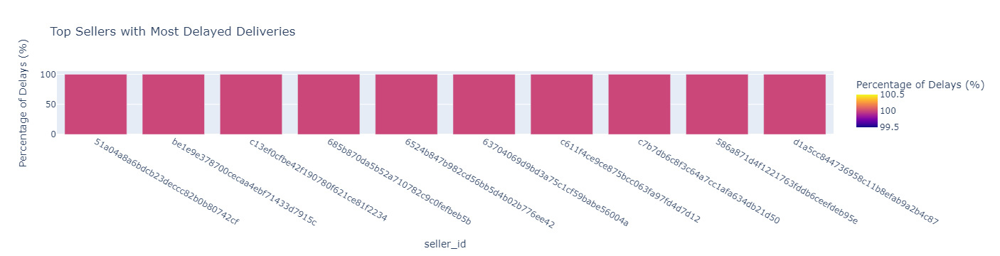

In [82]:
top_delayed_sellers = seller_delays.reset_index().head(10)
fig = px.bar(top_delayed_sellers, 
             x='seller_id', 
             y='Delayed', 
             title="Top Sellers with Most Delayed Deliveries",
             labels={'Delayed': 'Percentage of Delays (%)'},
             color='Delayed')
fig.show()

## Analyzing Delays by Payment Type

In [83]:
df = df.merge(order_payments, on='order_id', how='left')
df.columns

Index(['order_id', 'order_item_id', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value', 'customer_id',
       'order_status', 'order_purchase_timestamp', 'order_approved_at',
       'order_delivered_carrier_date', 'order_delivered_customer_date',
       'order_estimated_delivery_date', 'seller_zip_code_prefix',
       'seller_city', 'seller_state', 'product_category_name',
       'product_name_lenght', 'product_description_lenght',
       'product_photos_qty', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm', 'delivery_delay',
       'actual_delivery_time', 'delivery_status', 'payment_sequential',
       'payment_type', 'payment_installments', 'payment_value'],
      dtype='object')

In [86]:
df['payment_type'].value_counts()

payment_type
credit_card    86769
boleto         22867
voucher         6274
debit_card      1691
Name: count, dtype: int64

In [85]:
payment_delays = df.groupby('payment_type')['delivery_status'].value_counts(normalize=True).unstack() * 100
payment_delays = payment_delays.fillna(0)
payment_delays = payment_delays.sort_values(by='Delayed', ascending=False)
payment_delays

delivery_status,Delayed,On-Time
payment_type,,
boleto,6.95,93.05
credit_card,6.36,93.64
debit_card,5.50,94.50
voucher,5.26,94.74


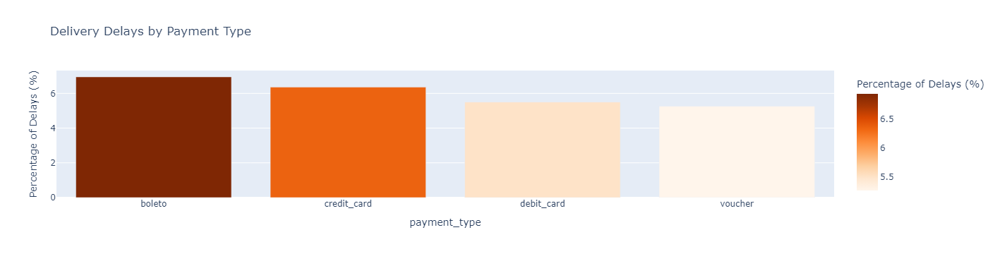

In [88]:
payment_delays = payment_delays.reset_index()
fig = px.bar(payment_delays, 
             x='payment_type', 
             y='Delayed', 
             title="Delivery Delays by Payment Type",
             labels={'payment_type_x':'Payment Type', 'Delayed': 'Percentage of Delays (%)'},
             color='Delayed', 
             color_continuous_scale='oranges')
fig.show()

### Insights:
* Boleto payments require manual processing and bank confirmation, which adds delays before an order is shipped.
*  Encouraging customers to use faster payment methods (e.g., credit cards) may reduce shipping delays.
* Some orders may have payment authorization issues or require fraud checks, delaying fulfillment.
* Debit payments are processed instantly, leading to quicker order fulfillment.
* Vouchers may be used for promotions or prepaid transactions, meaning orders don't wait for payment confirmation.
### Recommendations:
* Promote credit and debit card usage for faster payment processing.
* Offer discounts or incentives for customers using faster payment methods.
* Automate boleto payment confirmations where possible to speed up order processing.

# Clustering & Customer Sentiment

### Since customers who didn't leave a review still have order data, we can cluster them using:
* Order-related features 
* Review-based features
* Behavioral patterns 

In [89]:
customers = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_customers_dataset.csv")
orders =  pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_orders_dataset.csv")
order_items = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_order_items_dataset.csv")
order_reviews = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_order_reviews_dataset.csv")

In [92]:
df = orders.merge(customers, on='customer_id', how='left')
df = df.merge(order_items, on='order_id', how='left')
df = df.merge(order_reviews[['order_id', 'review_score']], on='order_id', how='left')
df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,review_score
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1.00,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,4.00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,1.00,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76,4.00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,1.00,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22,5.00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN,1.00,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,2017-11-23 19:45:59,45.00,27.20,5.00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP,1.00,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,2018-02-19 20:31:37,19.90,8.72,5.00


In [93]:
df['review_score'].value_counts()

review_score
5.00    63596
4.00    21348
1.00    14775
3.00     9476
2.00     3936
Name: count, dtype: int64

In [94]:
df['review_score'] == 0

0         False
1         False
2         False
3         False
4         False
          ...  
114087    False
114088    False
114089    False
114090    False
114091    False
Name: review_score, Length: 114092, dtype: bool

In [95]:
customer_features = df.groupby('customer_unique_id').agg({'order_id': 'count', 'price': 'sum', 'freight_value': 'sum', 'review_score': 'mean'}).reset_index()
customer_features

,customer_unique_id,order_id,price,freight_value,review_score
0,0000366f3b9a7992bf8c76cfdf3221e2,1,129.90,12.00,5.00
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1,18.90,8.29,4.00
2,0000f46a3911fa3c0805444483337064,1,69.00,17.22,3.00
3,0000f6ccb0745a6a4b88665a16c9f078,1,25.99,17.63,4.00
4,0004aac84e0df4da2b147fca70cf8255,1,180.00,16.89,5.00
...,...,...,...,...,...
96091,fffcf5a5ff07b0908bd4e2dbc735a684,2,1570.00,497.42,5.00
96092,fffea47cd6d3cc0a88bd621562a9d061,1,64.89,19.69,4.00
96093,ffff371b4d645b6ecea244b27531430a,1,89.90,22.56,5.00
96094,ffff5962728ec6157033ef9805bacc48,1,115.00,18.69,5.00


In [97]:
customer_features.rename(columns={'order_id': 'order_count', 'price': 'total_spent', 'freight_value': 'total_freight'}, inplace=True)
customer_features.columns

Index(['customer_unique_id', 'order_count', 'total_spent', 'total_freight',
       'review_score'],
      dtype='object')

In [98]:
customer_features.isnull().sum()

customer_unique_id      0
order_count             0
total_spent             0
total_freight           0
review_score          716
dtype: int64

In [99]:
imputer = KNNImputer()
customer_features[['review_score']] = imputer.fit_transform(customer_features[['review_score']])
customer_features.isnull().sum()

customer_unique_id    0
order_count           0
total_spent           0
total_freight         0
review_score          0
dtype: int64

In [100]:
scaler = StandardScaler()
scaled_features = scaler.fit_transform(customer_features[['order_count', 'total_spent', 'total_freight', 'review_score']])
scaled_features

array([[-0.28767987, -0.055694  , -0.49837187,  0.68460294],
       [-0.28767987, -0.56385633, -0.65832698, -0.06334647],
       [-0.28767987, -0.33449658, -0.27331375, -0.81129588],
       ...,
       [-0.28767987, -0.23881556, -0.04308187,  0.68460294],
       [-0.28767987, -0.12390678, -0.20993531,  0.68460294],
       [-0.28767987, -0.38947883, -0.38756739,  0.68460294]])

In [101]:
customer_features_scaled = pd.DataFrame(scaled_features, columns=['order_count', 'total_spent', 'total_freight', 'review_score'])
customer_features_scaled['customer_unique_id'] = customer_features['customer_unique_id']
customer_features_scaled

,order_count,total_spent,total_freight,review_score,customer_unique_id
0,-0.29,-0.06,-0.50,0.68,0000366f3b9a7992bf8c76cfdf3221e2
1,-0.29,-0.56,-0.66,-0.06,0000b849f77a49e4a4ce2b2a4ca5be3f
2,-0.29,-0.33,-0.27,-0.81,0000f46a3911fa3c0805444483337064
3,-0.29,-0.53,-0.26,-0.06,0000f6ccb0745a6a4b88665a16c9f078
4,-0.29,0.17,-0.29,0.68,0004aac84e0df4da2b147fca70cf8255
...,...,...,...,...,...
96091,1.25,6.54,20.43,0.68,fffcf5a5ff07b0908bd4e2dbc735a684
96092,-0.29,-0.35,-0.17,-0.06,fffea47cd6d3cc0a88bd621562a9d061
96093,-0.29,-0.24,-0.04,0.68,ffff371b4d645b6ecea244b27531430a
96094,-0.29,-0.12,-0.21,0.68,ffff5962728ec6157033ef9805bacc48


In [102]:
corr_matrix = customer_features_scaled.drop(columns=['customer_unique_id']).corr()
corr_matrix

,order_count,total_spent,total_freight,review_score
order_count,1.00,0.20,0.50,-0.09
total_spent,0.20,1.00,0.43,-0.03
total_freight,0.50,0.43,1.00,-0.07
review_score,-0.09,-0.03,-0.07,1.00


<Axes: >

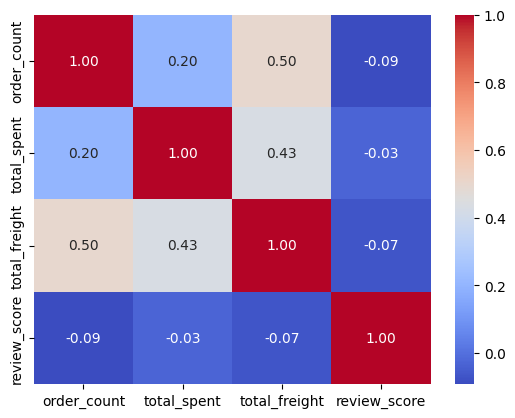

In [103]:
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')

In [104]:
df = customer_features_scaled.drop(columns=['customer_unique_id'])

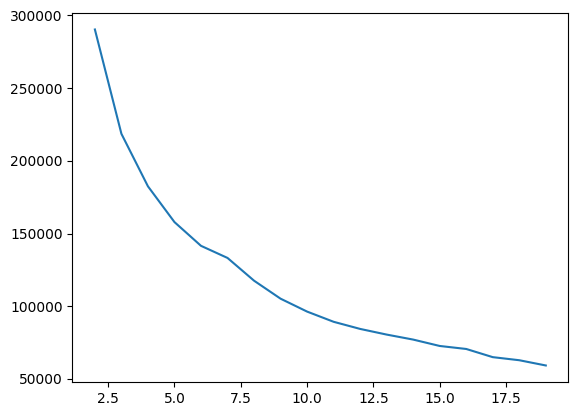

In [105]:
k_values = range(2, 20)
inertia_values = []
for k in k_values:
    model = KMeans(n_clusters=k)
    model.fit(df)
    model.transform(df)
    inertia_values.append(model.inertia_)

plt.plot(k_values, inertia_values)

In [106]:
k = 4
model = KMeans(n_clusters=k, random_state=42)
model.fit(df)
model.predict(df)

array([0, 0, 1, ..., 0, 0, 0])

In [107]:
predicaion = model.predict(df)
df['cluster'] = predicaion
df

,order_count,total_spent,total_freight,review_score,cluster
0,-0.29,-0.06,-0.50,0.68,0
1,-0.29,-0.56,-0.66,-0.06,0
2,-0.29,-0.33,-0.27,-0.81,1
3,-0.29,-0.53,-0.26,-0.06,0
4,-0.29,0.17,-0.29,0.68,0
...,...,...,...,...,...
96091,1.25,6.54,20.43,0.68,2
96092,-0.29,-0.35,-0.17,-0.06,0
96093,-0.29,-0.24,-0.04,0.68,0
96094,-0.29,-0.12,-0.21,0.68,0


In [108]:
model.inertia_

182486.81209957044

## Saving...

In [109]:
# Save preprocessed data
customer_features_scaled.to_csv('C:/Users/Mohamed Atef/Training/Olist - Brazilian E-Commerce Site/Preprocessed_Clustering.csv', index=False)
# Save Clustering data 
df.to_csv('C:/Users/Mohamed Atef/Training/Olist - Brazilian E-Commerce Site/clustered_customers.csv', index=False)

# Sales Prediction

##  Preprocess Data:
* Handle missing values & create relevant features.
*  Feature Engineering.
## Feature Engineering:
* Extract time-based features
## Train & Evaluate Models

In [112]:
customers = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_customers_dataset.csv")
orders =  pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_orders_dataset.csv")
order_items = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_order_items_dataset.csv")
order_payments = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_order_payments_dataset.csv")
order_reviews = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_order_reviews_dataset.csv")
products = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_products_dataset.csv")
sellers = pd.read_csv("D:\\Courses\\Datasets\\Brazilian E-Commerce Public Dataset by Olist\\olist_sellers_dataset.csv")

In [113]:
df = order_items.merge(orders, on="order_id", how="left")
df = df.merge(order_payments, on="order_id", how="left")
df = df.merge(products, on="product_id", how="left")
df = df.merge(sellers, on="seller_id", how="left")
df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,...,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,...,58.00,598.00,4.00,650.00,28.00,9.00,14.00,27277,volta redonda,SP
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,...,56.00,239.00,2.00,30000.00,50.00,30.00,40.00,3471,sao paulo,SP
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,...,59.00,695.00,2.00,3050.00,33.00,13.00,33.00,37564,borda da mata,MG
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,...,42.00,480.00,1.00,200.00,16.00,10.00,15.00,14403,franca,SP
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,...,59.00,409.00,1.00,3750.00,35.00,40.00,30.00,87900,loanda,PR


In [114]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117604 entries, 0 to 117603
Data columns (total 29 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   order_id                       117604 non-null  object 
 1   order_item_id                  117604 non-null  int64  
 2   product_id                     117604 non-null  object 
 3   seller_id                      117604 non-null  object 
 4   shipping_limit_date            117604 non-null  object 
 5   price                          117604 non-null  float64
 6   freight_value                  117604 non-null  float64
 7   customer_id                    117604 non-null  object 
 8   order_status                   117604 non-null  object 
 9   order_purchase_timestamp       117604 non-null  object 
 10  order_approved_at              117589 non-null  object 
 11  order_delivered_carrier_date   116359 non-null  object 
 12  order_delivered_customer_date 

## Handling Missing Values

In [115]:
missing_values = df.isnull().sum()
missing_values[missing_values > 0]

order_approved_at                  15
order_delivered_carrier_date     1245
order_delivered_customer_date    2567
payment_sequential                  3
payment_type                        3
payment_installments                3
payment_value                       3
product_category_name            1698
product_name_lenght              1698
product_description_lenght       1698
product_photos_qty               1698
product_weight_g                   20
product_length_cm                  20
product_height_cm                  20
product_width_cm                   20
dtype: int64

In [116]:
df.drop(columns=["order_approved_at", "payment_sequential"], inplace=True)

In [117]:
df["payment_type"].fillna(df["payment_type"].mode()[0], inplace=True)
df["product_category_name"].fillna("unknown", inplace=True)

In [118]:
num_cols = [
    "payment_installments", "payment_value", "product_name_lenght", 
    "product_description_lenght", "product_photos_qty", "product_weight_g", 
    "product_length_cm", "product_height_cm", "product_width_cm"
]

for col in num_cols:
    df[col].fillna(df[col].median(), inplace=True)

In [119]:
missing_values_after = df.isnull().sum().sum()
missing_values_after

3812

In [120]:
remaining_missing_values = df.isnull().sum()
remaining_missing_values[remaining_missing_values > 0]

order_delivered_carrier_date     1245
order_delivered_customer_date    2567
dtype: int64

The remaining missing values are likely in delivery-related columns (order_delivered_carrier_date, order_delivered_customer_date). These missing values indicate orders that have not yet been shipped or delivered, so we will keep them as they may be useful for sales trends.

## Encoding Categorical Data

In [121]:
cat_cols = df.select_dtypes(include=["object"]).columns
cat_cols

Index(['order_id', 'product_id', 'seller_id', 'shipping_limit_date',
       'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_delivered_carrier_date', 'order_delivered_customer_date',
       'order_estimated_delivery_date', 'payment_type',
       'product_category_name', 'seller_city', 'seller_state'],
      dtype='object')

* order_id, product_id, seller_id, customer_id → These are unique IDs, no need to encode.
* shipping_limit_date, order_delivered_carrier_date, order_delivered_customer_date, order_estimated_delivery_date → Need date transformation.
* order_status → Needs One-Hot Encoding.
* seller_city, seller_state → Needs Label Encoding.

In [122]:
df = pd.get_dummies(df, columns=["payment_type"], drop_first=True)
encoder = LabelEncoder()
df["product_category_name"] = encoder.fit_transform(df["product_category_name"])
df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,...,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state,payment_type_credit_card,payment_type_debit_card,payment_type_voucher
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,...,650.00,28.00,9.00,14.00,27277,volta redonda,SP,True,False,False
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,...,30000.00,50.00,30.00,40.00,3471,sao paulo,SP,True,False,False
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,...,3050.00,33.00,13.00,33.00,37564,borda da mata,MG,True,False,False
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,...,200.00,16.00,10.00,15.00,14403,franca,SP,True,False,False
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,...,3750.00,35.00,40.00,30.00,87900,loanda,PR,True,False,False


## Transforming Date Columns

* shipping_limit_date → Extract year, month, day, and convert to datetime format.
* order_delivered_carrier_date, order_delivered_customer_date, order_estimated_delivery_date → Convert to datetime and create new features
  * delivery_days_actual = order_delivered_customer_date - order_delivered_carrier_date
  * delivery_days_expected = order_estimated_delivery_date - order_delivered_carrier_date
  * delivery_delay = delivery_days_actual - delivery_days_expected (if > 0, delayed orders)

In [123]:
date_columns = ["shipping_limit_date", "order_delivered_carrier_date", "order_delivered_customer_date", "order_estimated_delivery_date"]
for col in date_columns:
    df[col] = pd.to_datetime(df[col], errors="coerce")

df["shipping_year"] = df["shipping_limit_date"].dt.year
df["shipping_month"] = df["shipping_limit_date"].dt.month
df["shipping_day"] = df["shipping_limit_date"].dt.day
df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,...,product_width_cm,seller_zip_code_prefix,seller_city,seller_state,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,shipping_year,shipping_month,shipping_day
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,...,14.00,27277,volta redonda,SP,True,False,False,2017,9,19
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,...,40.00,3471,sao paulo,SP,True,False,False,2017,5,3
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,...,33.00,37564,borda da mata,MG,True,False,False,2018,1,18
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,...,15.00,14403,franca,SP,True,False,False,2018,8,15
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,...,30.00,87900,loanda,PR,True,False,False,2017,2,13


In [124]:
df["delivery_days_actual"] = (df["order_delivered_customer_date"] - df["order_delivered_carrier_date"]).dt.days
df["delivery_days_expected"] = (df["order_estimated_delivery_date"] - df["order_delivered_carrier_date"]).dt.days
df["delivery_delay"] = df["delivery_days_actual"] - df["delivery_days_expected"]
df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,...,seller_state,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,shipping_year,shipping_month,shipping_day,delivery_days_actual,delivery_days_expected,delivery_delay
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,...,SP,True,False,False,2017,9,19,1.00,9.00,-8.00
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,...,SP,True,False,False,2017,5,3,8.00,10.00,-2.00
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,...,MG,True,False,False,2018,1,18,6.00,19.00,-13.00
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,...,SP,True,False,False,2018,8,15,4.00,9.00,-5.00
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,...,PR,True,False,False,2017,2,13,13.00,28.00,-15.00


In [125]:
df.drop(columns=date_columns, inplace=True)
df.head()

,order_id,order_item_id,product_id,seller_id,price,freight_value,customer_id,order_status,order_purchase_timestamp,payment_installments,...,seller_state,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,shipping_year,shipping_month,shipping_day,delivery_days_actual,delivery_days_expected,delivery_delay
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,58.90,13.29,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2.00,...,SP,True,False,False,2017,9,19,1.00,9.00,-8.00
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,239.90,19.93,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,3.00,...,SP,True,False,False,2017,5,3,8.00,10.00,-2.00
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,199.00,17.87,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,5.00,...,MG,True,False,False,2018,1,18,6.00,19.00,-13.00
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,12.99,12.79,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,2.00,...,SP,True,False,False,2018,8,15,4.00,9.00,-5.00
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,199.90,18.14,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,3.00,...,PR,True,False,False,2017,2,13,13.00,28.00,-15.00


In [126]:
missing_values = df.isnull().sum()
missing_values[missing_values > 0]

delivery_days_actual      2568
delivery_days_expected    1245
delivery_delay            2568
dtype: int64

In [127]:
df["delivery_days_actual"].fillna(df["delivery_days_actual"].median(), inplace=True)
df["delivery_days_expected"].fillna(df["delivery_days_expected"].mean(), inplace=True)
df["delivery_delay"].fillna(df["delivery_delay"].median(), inplace=True)
df.isnull().sum().sum()

0

## Detecting and Handling Outliers

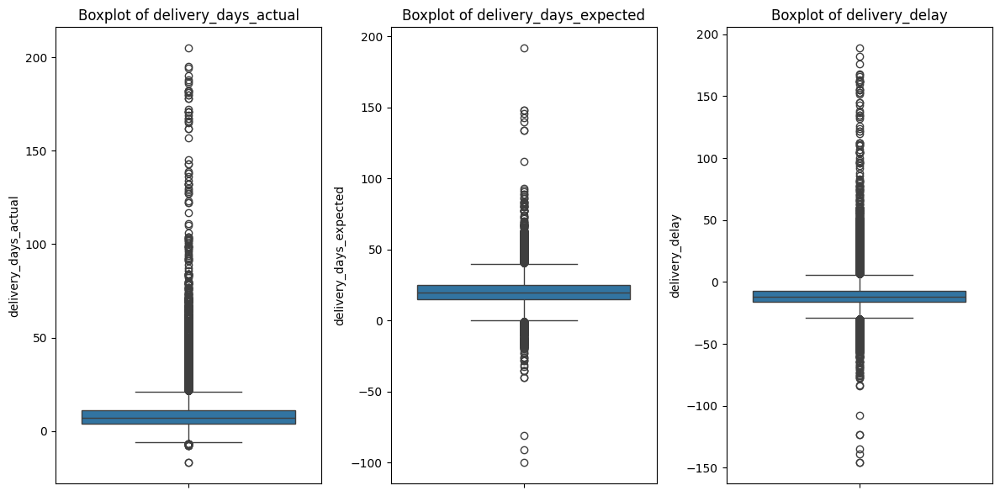

In [128]:
num_cols = ["delivery_days_actual", "delivery_days_expected", "delivery_delay"]
plt.figure(figsize=(12, 6))
for i, col in enumerate(num_cols, 1):
    plt.subplot(1, 3, i)
    sns.boxplot(y=df[col])
    plt.title(f"Boxplot of {col}")
plt.tight_layout()
plt.show()

In [129]:
q1 = df[num_cols].quantile(0.25)
q3 = df[num_cols].quantile(0.75)
iqr = q3 - q1

lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

for col in num_cols:
    df[col] = df[col].clip(lower=lower_bound[col], upper=upper_bound[col])

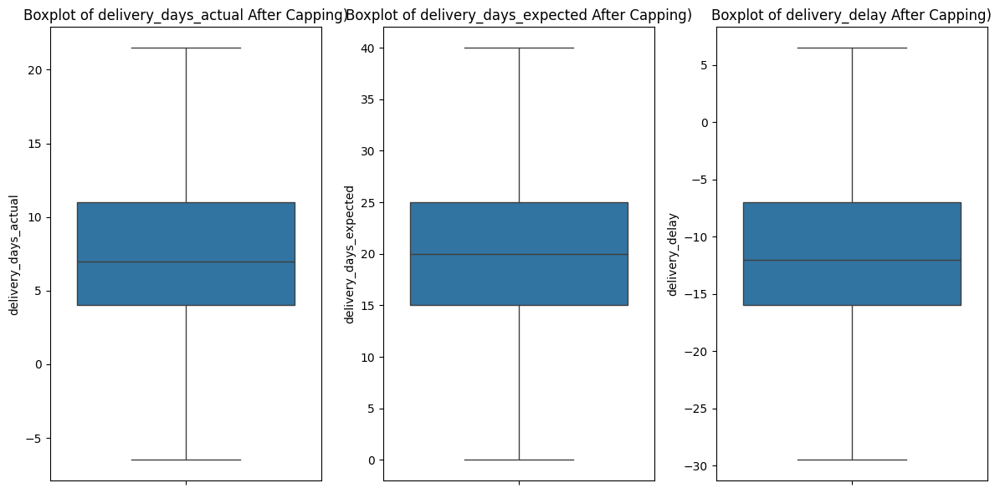

In [130]:
plt.figure(figsize=(12, 6))
for i, col in enumerate(num_cols, 1):
    plt.subplot(1, 3, i)
    sns.boxplot(y=df[col])
    plt.title(f"Boxplot of {col} After Capping)")
plt.tight_layout()
plt.show()

## Splitting Data into Train and Test Sets

In [131]:
df.columns

Index(['order_id', 'order_item_id', 'product_id', 'seller_id', 'price',
       'freight_value', 'customer_id', 'order_status',
       'order_purchase_timestamp', 'payment_installments', 'payment_value',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'seller_zip_code_prefix', 'seller_city', 'seller_state',
       'payment_type_credit_card', 'payment_type_debit_card',
       'payment_type_voucher', 'shipping_year', 'shipping_month',
       'shipping_day', 'delivery_days_actual', 'delivery_days_expected',
       'delivery_delay'],
      dtype='object')

In [132]:
x = df.drop(columns=['price'])
y = df['price']

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

print("Training set size:", x_train.shape)
print("Testing set size:", x_test.shape)

Training set size: (94083, 30)
Testing set size: (23521, 30)


## Pipeline & Scaling

In [133]:
num_cols = x_train.select_dtypes(include=['int64', 'float64']).columns
cat_cols = x_train.select_dtypes(include=['object']).columns

In [134]:
num_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
                        ])


cat_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', OneHotEncoder(handle_unknown='ignore', sparse_output=True))
                        ])

In [135]:
x_train_num = num_pipeline.fit_transform(x_train[num_cols])
x_test_num = num_pipeline.transform(x_test[num_cols])

x_train_cat = cat_pipeline.fit_transform(x_train[cat_cols])
x_test_cat = cat_pipeline.transform(x_test[cat_cols])

In [136]:
x_train_num_sparse = csr_matrix(x_train_num)
x_test_num_sparse = csr_matrix(x_test_num)

In [137]:
x_train = hstack([x_train_num_sparse, x_train_cat])
x_test = hstack([x_test_num_sparse, x_test_cat])

In [138]:
model = Pipeline([('model', Ridge())])

## Why Ridge?
* Handles Multicollinearity: dataset likely has many correlated features, and Ridge helps reduce their impact by applying L2 regularization.
* Prevents Overfitting: With a high number of features (especially from OneHotEncoding), Ridge reduces overfitting by penalizing large coefficients.
* Efficient for High-Dimensional Data: Since we have thousands of categorical features, Ridge works well in such scenarios.

## Other Models?
* Random Forest
* XGBoost
* Gradient Boosting

In [140]:
model.fit(x_train, y_train)

Pipeline(steps=[('model', Ridge())])

In [141]:
score = model.score(x_test, y_test)
print(f'Model Score: {(score * 100):.2f} %')

Model Score: 90.80 %


## Hyperparameter Tuning

In [142]:
param_grid = {'model__alpha': [0.01, 0.1, 1, 10, 50, 100, 500, 1000],  
              'model__solver': ['auto', 'lsqr', 'saga'],  
              'model__fit_intercept': [True, False] }

In [143]:
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_root_mean_squared_error', n_jobs=-1)
grid_search.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=Pipeline(steps=[('model', Ridge())]), n_jobs=-1,
             param_grid={'model__alpha': [0.01, 0.1, 1, 10, 50, 100, 500, 1000],
                         'model__fit_intercept': [True, False],
                         'model__solver': ['auto', 'lsqr', 'saga']},
             scoring='neg_root_mean_squared_error')

In [144]:
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best RMSE: {-grid_search.best_score_}")
print(f'Best Model: {grid_search.best_estimator_}')

Best parameters: {'model__alpha': 0.01, 'model__fit_intercept': False, 'model__solver': 'lsqr'}
Best RMSE: 58.77001842757521
Best Model: Pipeline(steps=[('model',
                 Ridge(alpha=0.01, fit_intercept=False, solver='lsqr'))])


## Saving...

In [145]:
for idx in range(x_train.shape[1]):
    x_train = pd.DataFrame(x_train, columns=[f'feature {idx}'])

for idx in range(x_test.shape[1]):
    x_test = pd.DataFrame(x_test, columns=[f'feature {idx}'])

x_train['price'] = y_train.values
x_test['price'] = y_test.values

x_train.to_csv('C:/Users/Mohamed Atef/Training/Olist - Brazilian E-Commerce Site/Rreprocessed_train.csv', index=False)
x_test.to_csv('C:/Users/Mohamed Atef/Training/Olist - Brazilian E-Commerce Site/Rreprocessed_test.csv', index=False)

joblib.dump(grid_search.best_estimator_, 'C:/Users/Mohamed Atef/Training/Olist - Brazilian E-Commerce Site/Ridge_model.pkl')

['C:/Users/Mohamed Atef/Training/Olist - Brazilian E-Commerce Site/Ridge_model.pkl']